# [Bacterial Colony Growth](@id Bacteries)

In this example, we are going to create a bacterial model and grow a colony using it.

 - The implementation of the force interaction dynamics is the one presented by [Volfson et al. (2008)](https://www.pnas.org/doi/abs/10.1073/pnas.0706805105)
 - We use GPU accelerated dynamics

As described in other models, it is advised that the models are constructed by parts to avoid having to find bugs in a very complex system. Hence, we will split the model in two parts:

 - Forces model
 - Growth model

## Load the packages

In [1]:
using Base.Threads
println("Usando ", nthreads(), " threads 😎")

Usando 15 threads 😎


In [2]:
# import Pkg
# Pkg.activate("../")
# Pkg.instantiate()


In [3]:
# import Pkg; Pkg.add(["Revise", "GLMakie"])

In [4]:
# using Revise
# using CellBasedModels
# using CUDA
# using Distributions
# using GLMakie
# # using GeometryBasics
# import GLMakie: Point3f, Cylinder, Sphere, NoShading #Can be changes to Cairo or CLMakie

In [5]:
import Pkg

# Activa el entorno del proyecto
# Pkg.activate("C:/Users/julia/OneDrive/Escritorio/phd/Bacteria_ABM/ABM_CBM/")

# Pkg.activate("/home/julia/Escritorio/Projects/Pushing/ABM_CBM")
Pkg.activate("C:/Users/julia/OneDrive/Escritorio/phd/Bacteria_ABM/ABM_CBM/")


# Resuelve y asegura dependencias
Pkg.resolve()
Pkg.instantiate()


# Carga los paquetes de forma ordenada
using Revise
using CellBasedModels
ENV["JULIA_CUDA_USE_BINARYBUILDER"] = false  # (opcional, fuerza compilación local)
using CUDA
CUDA.set_runtime_version!(v"12.2")
using Distributions
using CairoMakie
using JSON

# Importa funciones específicas después
import CairoMakie: Point3f, Cylinder, Sphere, NoShading

CairoMakie.activate!()


  Activating project at `C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM`
  No Changes to `C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM\Project.toml`
  No Changes to `C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM\Manifest.toml`
┌ Info: Configure the active project to use CUDA 12.2; please re-start Julia for this to take effect.
└ @ CUDA C:\Users\julia\.julia\packages\CUDA\jdJ7Z\lib\cudadrv\version.jl:82


## Forces model

We already use the defined forces model that is implemented in CBqodels. This is an exact copy of the rod model that you can find already predefined in `Models/rods.jl`. You can check the `Models` section of the documentation for more details.


In [6]:
rod2D = ABM(2,
    agent = Dict(
            :theta=>Float64,
            :d=>Float64,
            :l=>Float64,
            :fx=>Float64,
            :fy=>Float64,
            :W=>Float64,
        ),    #Local Interaction Parameters

    model = Dict(
            :E=>Float64,
            :eta=>Float64,

        ),        #Global parameters

    agentODE = quote

        fx = 0
        fy = 0
        W = 0
        @loopOverNeighbors i2 begin

            #Use the model provided in the documentation
            Fijx, Fijy, Wij = CBMModels.repulsiveForces_rods(x,y,d,l,theta,
                                    x[i2],y[i2],d[i2],l[i2],theta[i2],eta, E)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            W += Wij
            
        end

        #Equations
        dt(x) =  fx 
        dt(y) =  fy 
        dt(theta) =  W
    end,

    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=4),
    platform=CPU(),
    agentAlg = CBMIntegrators.Heun()
);


### Initialize a coqunity with two bacteries and check forces

In [7]:
com = Community(rod2D,
            N=30,
            dt=0.0001,
            simBox = [-10 10;-10 10.],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.E=1* 1.E6 *m/(t^2*d) #Pa
com.eta = 200 *m/(t^2*d) #Pa h
 

com.d = 1.        
com.l = 3.99      



com.x = 0
com.y = 0
com.theta = 0;


In [8]:
com.N

30

In [9]:
for i in 1:com.N
    com.theta[i] = rand() * 2π
    com.x[i] = rand()*10-5
    com.y[i] = rand()*10-5
    com.l[i] = 3.0
    com.d[i] = 1.0

end

In [10]:
com.theta[1]=20

20

In [11]:
evolve!(com,steps=10000,saveEach=100,preallocateAgents=com.N)

In [12]:
function plotAgents2D!(ax, x, y, d, l, angle, p; colormap=:inferno, kargs...)
    for (xi, yi, li, di, ai, pi) in zip(x, y, l, d, angle, p)



            colorval = pi
            # colormap = :inferno
            meshscatter!(ax,
                [xi + li/2 * cos(ai)],
                [yi + li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [colorval],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi - li/2 * cos(ai)],
                [yi - li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [colorval],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi],
                [yi];
                marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
                markersize = [Point3f(li, di/2, di/2)],
                rotation = [ai],
                color = [colorval],
                colormap = colormap,
                kargs...
            )

    end
    return
end


plotAgents2D! (generic function with 1 method)

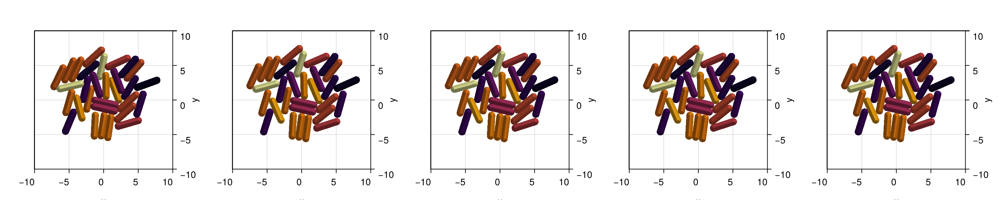

CairoMakie.Screen{IMAGE}


In [13]:
fig = Figure(size=(1500,300))

for (i,j) in enumerate([1:round(Int,length(com)/4):length(com);length(com)])
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:theta],
    colorrange = (0, 2*pi)
)

    xlims!(-10,10)
    ylims!(-10,10)
end

display(fig)

In [14]:

function log_community_state(parameters::OrderedDict, t::Int, path::String )
    # Convert keys to strings so JSON can serialize them
    string_keys = Dict(string(k) => v for (k, v) in parameters)
    # Build entry
    entry = Dict("t" => t, "parameters" => string_keys)
    # Save as a JSON line
    open(path, "a") do io
        println(io, JSON.json(entry))
    end
end


function load_parameters_log(path::String )
    log = Dict{Int, OrderedDict{Symbol, Any}}()
    for line in eachline(path)
        entry = JSON.parse(line)
        t = entry["t"]
        raw_params = entry["parameters"]
        params = OrderedDict(Symbol(k) => v for (k, v) in raw_params)
        log[t] = params
    end
    times = sort(collect(keys(log)))
    com_array = [log[t] for t in times]
    return com_array, times
end



load_parameters_log (generic function with 1 method)

In [15]:
2*pi

6.283185307179586

# Bacteria 3D

In [16]:
rod3D = ABM(3,
    agent = Dict(
            :theta=>Float64,
            :phi =>Float64,
            :d=>Float64,
            :l=>Float64,
            :fx=>Float64,
            :fy=>Float64,
            :fz=>Float64,
            :Wtheta=>Float64,
            :Wphi=>Float64,
        ),    #Local Interaction Parameters

    model = Dict(
            :E=>Float64,
            :eta=>Float64,

        ),        #Global parameters

    agentODE = quote

        fx = 0
        fy = 0
        fz = 0
        Wtheta = 0
        Wphi = 0 
        @loopOverNeighbors i2 begin

            #Use the model provided in the documentation
            Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.repulsiveForces_rods3d(x,y,z,d,l,theta, phi,
                                    x[i2],y[i2],z[i2],d[i2],l[i2],theta[i2], phi[i2], eta, E)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            fz += Fijz
            Wtheta += Wijtheta
            Wphi += Wijphi
            
        end

        #Equations
        dt(x) =  fx 
        dt(y) =  fy 
        dt(z) =  fz
        dt(theta) =  Wtheta
        dt(phi) = Wphi
    end,

    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=4),
    platform=CPU(),
    agentAlg = CBMIntegrators.Heun()
);


In [17]:
com = Community(rod3D,
            N=30,
            dt=0.0001,
            simBox = [-10 10;-10 10; -10 10],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.E=1* 1.E6 *m/(t^2*d) #Pa
com.eta = 200 *m/(t^2*d) #Pa h
 

com.d = 1.        
com.l = 3.     



com.x = 0
com.y = 0
com.z = 0
com.theta = 0
com.phi = 0
# com.x[2]=1
# # com.theta[1]=pi/2
# com.phi[1]=pi/2


0

In [18]:
for i in 1:com.N
    com.theta[i] = 0
    com.x[i] = rand()*10-5
    com.z[i] = rand()*10-5
    com.l[i] = 3.0
    com.d[i] = 1.0
    com.phi[i]= rand() * 2π
end

In [159]:
function plotAgents3D!(ax, x, y, z, d, l, theta, phi, p; colormap=:inferno, kargs...)
    # Recomendado: en tu Axis3 usa aspect=:data para evitar distorsión de ejes
    # ej.: ax = Axis3(fig[1,1]; aspect=:data)

    for (xi, yi, zi, di, li, thetai, phii, pi) in zip(x, y, z, d, l, theta, phi, p)
        # Dirección unitaria u(θ,φ)
        ux = cos(thetai) * cos(phii)
        uy = sin(thetai) * cos(phii)
        uz = sin(phii)

        # Polos (extremos)
        x_plus  = xi + 0.5 * li * ux
        y_plus  = yi + 0.5 * li * uy
        z_plus  = zi + 0.5 * li * uz

        x_minus = xi - 0.5 * li * ux
        y_minus = yi - 0.5 * li * uy
        z_minus = zi - 0.5 * li * uz

        r = Float32(di/2)

        # Color: usa tu escalar 'pi' con colormap (fija un rango 0..1; ajusta si necesitas)
        colorrange = (0.0, 1.0)
        # Cilindro que UNE los polos (Makie lo orienta solo con p1->p2)
        mesh!(ax, Cylinder(
            Point3f(x_minus, y_minus, z_minus),
            Point3f(x_plus,  y_plus,  z_plus),
            r);
            color=pi, colormap=colormap, colorrange=colorrange, kargs...)

        # Esferas en los polos
        mesh!(ax, Sphere(Point3f(x_plus,  y_plus,  z_plus),  r);
             color=pi, colormap=colormap, colorrange=colorrange, kargs...)
        mesh!(ax, Sphere(Point3f(x_minus, y_minus, z_minus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kargs...)


    end
    return
end


plotAgents3D! (generic function with 1 method)

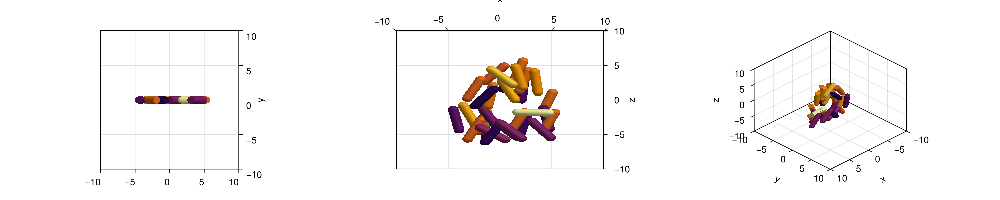

CairoMakie.Screen{IMAGE}


In [20]:
fig = Figure(size=(1500,300))

# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.

    ax = Axis3(fig[1,1],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents3D!(
    ax,
    com[:x],
    com[:y],
    com[:z],
    com[:d],
    com[:l],
    com[:theta],
    com[:phi],
    com[:theta].+com[:phi],
    colorrange = (0, 2*pi)
    )

    xlims!(-10,10)
    ylims!(-10,10)
    zlims!(-10,10)

    ax2 = Axis3(fig[1,2],
                azimuth=3*π/2,
                elevation=0,
                ylabelvisible=false,
                yticklabelsvisible=false,
                ygridvisible=false,
                yspinesvisible=false
            )

    plotAgents3D!(
    ax2,
    com[:x],
    com[:y],
    com[:z],
    com[:d],
    com[:l],
    com[:theta],
    com[:phi],
    com[:theta].+com[:phi],
    colorrange = (0, 2*pi)
)

    xlims!(-10,10)
    ylims!(-10,10)
    zlims!(-10,10)

    ax3 = Axis3(fig[1,3],
            azimuth = π/4,    # 45° en XY
            elevation = π/6,  # 30° arriba del plano
        )

    plotAgents3D!(
    ax3,
    com[:x],
    com[:y],
    com[:z],
    com[:d],
    com[:l],
    com[:theta],
    com[:phi],
    com[:theta].+com[:phi],
    colorrange = (0, 2*pi)
)

    xlims!(-10,10)
    ylims!(-10,10)
    zlims!(-10,10)


display(fig)

In [21]:
evolve!(com,steps=10000,saveEach=100,preallocateAgents=com.N)

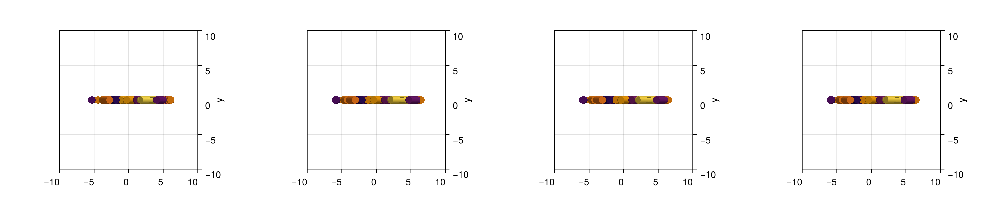

CairoMakie.Screen{IMAGE}


In [22]:
fig = Figure(size=(1500,300))

# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
for (i,j) in enumerate([1:round(Int,length(com)/4):length(com);length(com)][1:4])
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents3D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:z],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:phi],
    com[j][:theta].+com[j][:phi],
    colorrange = (0, 2*pi)
)

    xlims!(-10,10)
    ylims!(-10,10)
    zlims!(-10,10)
end

display(fig)

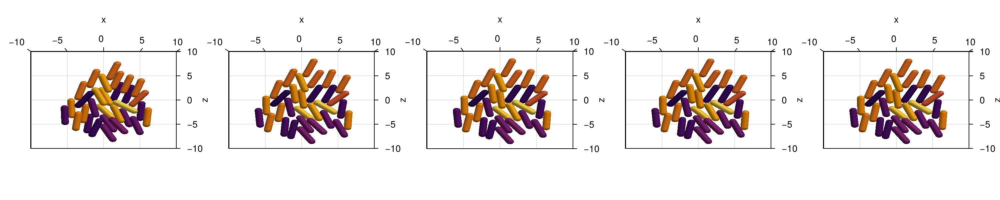

CairoMakie.Screen{IMAGE}


In [23]:
fig = Figure(size=(1500,300))

# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
for (i,j) in enumerate([1:round(Int,length(com)/4):length(com);length(com)])
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=0,
                ylabelvisible=false,
                yticklabelsvisible=false,
                ygridvisible=false,
                yspinesvisible=false
            )

    plotAgents3D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:z],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:phi],
    com[j][:theta].+com[j][:phi],
    colorrange = (0, 2*pi)
)

    xlims!(-10,10)
    ylims!(-10,10)
    zlims!(-10,10)
end

display(fig)

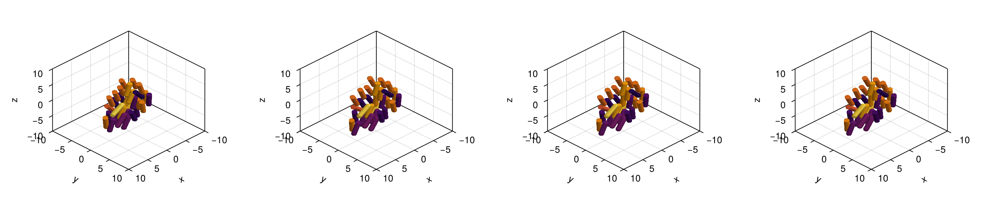

CairoMakie.Screen{IMAGE}


In [24]:
fig = Figure(size=(1500,300))

# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
for (i,j) in enumerate([1:round(Int,length(com)/4):length(com);length(com)][1:4])
    ax = Axis3(fig[1,i],
                azimuth = π/4,    # 45° en XY
                elevation = π/6,  # 30° arriba del plano
            )

    plotAgents3D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:z],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:phi],
    com[j][:theta].+com[j][:phi],
    colorrange = (0, 2*pi)
)

    xlims!(-10,10)
    ylims!(-10,10)
    zlims!(-10,10)
end

display(fig)

## Growth model

We construct over the forces model to add bacterial growth and cell division rules.

In [164]:
rod3D_grow = ABM(3,
    agent = Dict(
            :theta=>Float64,
            :phi =>Float64,
            :d=>Float64,
            :l=>Float64,
            :fx=>Float64,
            :fy=>Float64,
            :fz=>Float64,
            :Wtheta=>Float64,
            :Wphi=>Float64,
            :lTarget => Float64,
            :growth=>Float64,
            :p=>Float64,
        ),    #Local Interaction Parameters

    model = Dict(
            :E=>Float64,
            :eta=>Float64,
            :lMax => Float64,
            :σlTarget => Float64,

        ),        #Global parameters

    agentODE = quote

        fx = 0
        fy = 0
        fz = 0
        Wtheta = 0
        Wphi = 0 
        
        dt(l) = l*growth*1/(1+p)

        @loopOverNeighbors i2 begin

            #Use the model provided in the documentation
            Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.repulsiveForces_rods3d(x,y,z,d,l,theta, phi,
                                    x[i2],y[i2],z[i2],d[i2],l[i2],theta[i2], phi[i2], eta, E)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            fz += Fijz
            Wtheta += Wijtheta
            Wphi += Wijphi

            
            
        end
        p = sqrt(fx^2 + fy^2 + fz^2)
        #Equations
        dt(x) =  fx 
        dt(y) =  fy 
        dt(z) =  fz
        dt(theta) =  Wtheta
        dt(phi) = Wphi
    end,

    agentRule = quote #Bound cells

        #Add division
        if l > lTarget
            ww = CBMDistributions.uniform(-1,1) #To add some random torque at division time
            # ww = 0 #To add some random torque at division time
            #Add a new cell
            @addAgent(
                    x=(l+d)/4*cos(theta)+x,
                    y=(l+d)/4*sin(theta)+y,
                    l=(l-d)/2,
                    Wtheta=ww,
                    lTarget = CBMDistributions.uniform(lMax-σlTarget,lMax+σlTarget),
                    )
            #Add a second cell
            @addAgent(
                    x=-(l+d)/4*cos(theta)+x,
                    y=-(l+d)/4*sin(theta)+y,
                    l=(l-d)/2,
                    Wtheta=ww,
                    lTarget = CBMDistributions.uniform(lMax-σlTarget,lMax+σlTarget), #New target length at which the bactery should divide
                    )
            #Remove the old cell
            @removeAgent()
        end
        
    end,

    # neighborsAlg=CBMNeighbors.VerletDisplacement(skin=4.0, nMaxNeighbors=500),
    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=4),
    platform=CPU(),
    agentAlg = CBMIntegrators.Heun()
);


In [165]:
com = Community(rod3D_grow,
            N=1,
            dt=0.0001,
            simBox = [-100 100;-100 100.; -100 100],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.E=5* 1.E5 *m/(t^2*d) #Pa
com.eta = 200 *m/(t^2*d) #Pa h

com.growth = 5
com.lMax = 4.     
com.σlTarget = 1.5 

com.d = 1.        
com.l = 3.99      
com.lTarget = 4.  
com.x=0
com.y=0
com.theta=0

com.p=0

# com.PGA=0
# com.alpha_PGA = 10000
# com.delta_PGA = 100
# com.D_PGA = 50
# com.npc = 1
# com.v = 2.5*10^7
# com.Kpc=0.00001
# com.Kpq=10
# com.npq=10

# com.PGA=0
# com.alpha_PGA = 1000
# com.alpha_PGA = 0
# com.delta_PGA = 2000
# com.beta_PGA = 0
# com.Kp = 0.2
# com.D_PGA = 20
# com.npc = 1
# com.nu = 2.5*10^8
# com.Kpc=0.01
# com.Kpq=10
# com.npq=20

# com.D_c = 1000
# com.cm = 1 #Medium concentration
# com.c = com.cm 
# com.Kc = 1 #Half saturation constant for the medium
# com.beta_c = 50 #Growth rate of the cells in the medium


# com.Vm = -149
# com.alpha_V = -150
# com.delta_V = 1
# com.beta_V = 100
# com.KVc = 5E-4
# com.nV = 10

# com.QS=0
# com.alpha_QS = 10
# com.delta_QS = 0.5
# com.D_QS = 50 

# com.A=0.3




0

In [166]:
file="Evolution.txt"
open(file, "w") do f
    # clear file at start
end

In [167]:
prev_steps=Int(round(0/com.dt))
steps=Int(round(15/com.dt))
saveEach = Int(round(1/com.dt))/10
N=com.N*4

loadToPlatform!(com,preallocateAgents=N)

step=prev_steps
log_community_state(com.parameters, step, file)


while (step<steps+1) & (com.N < 2000)
    
    step!(com)

    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N[1] <= 0
                println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N[1]  < 4*com.N[1]
                N = 15*com.N[1]
        end 
        println("Step ",step, " N: ", com.N[1])
        log_community_state(com.parameters, step, file)
        loadToPlatform!(com,preallocateAgents=N)
    end
    step += 1
end
bringFromPlatform!(com)

Step 0 N: 1
Step 1000 N: 2
Step 2000 N: 2
Step 3000 N: 2
Step 4000 N: 3
Step 5000 N: 4
Step 6000 N: 5
Step 7000 N: 7
Step 8000 N: 8
Step 9000 N: 8
Step 10000 N: 10
Step 11000 N: 14
Step 12000 N: 16
Step 13000 N: 17
Step 14000 N: 17
Step 15000 N: 24
Step 16000 N: 26
Step 17000 N: 29
Step 18000 N: 31
Step 19000 N: 36
Step 20000 N: 44
Step 21000 N: 48
Step 22000 N: 55
Step 23000 N: 62
Step 24000 N: 72
Step 25000 N: 77
Step 26000 N: 83
Step 27000 N: 85
Step 28000 N: 93
Step 29000 N: 107
Step 30000 N: 116
Step 31000 N: 124
Step 32000 N: 138
Step 33000 N: 151
Step 34000 N: 157
Step 35000 N: 165
Step 36000 N: 180
Step 37000 N: 193
Step 38000 N: 206
Step 39000 N: 225
Step 40000 N: 242
Step 41000 N: 255
Step 42000 N: 268
Step 43000 N: 290
Step 44000 N: 311
Step 45000 N: 322
Step 46000 N: 341
Step 47000 N: 367
Step 48000 N: 381
Step 49000 N: 399
Step 50000 N: 415
Step 51000 N: 442
Step 52000 N: 466
Step 53000 N: 496
Step 54000 N: 519
Step 55000 N: 552
Step 56000 N: 596
Step 57000 N: 620
Step 580

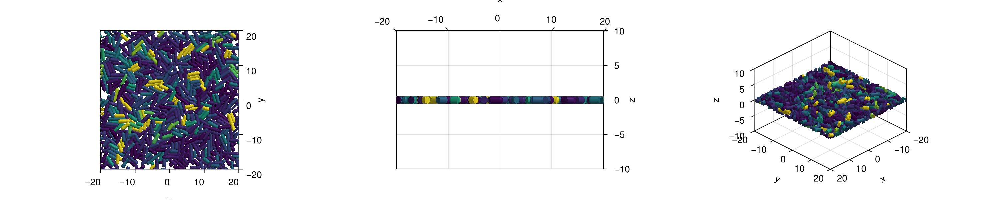

CairoMakie.Screen{IMAGE}


In [188]:
fig = Figure(size=(1500,300))

# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.

    ax = Axis3(fig[1,1],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents3D!(
    ax,
    com[:x],
    com[:y],
    com[:z],
    com[:d],
    com[:l],
    com[:theta],
    com[:phi],
    com[:p],
    colorrange = (0, 100),
    colormap = :viridis
    )

    xlims!(-20,20)
    ylims!(-20,20)
    zlims!(-10,10)

    ax2 = Axis3(fig[1,2],
                azimuth=3*π/2,
                elevation=0,
                ylabelvisible=false,
                yticklabelsvisible=false,
                ygridvisible=false,
                yspinesvisible=false
            )

    plotAgents3D!(
    ax2,
    com[:x],
    com[:y],
    com[:z],
    com[:d],
    com[:l],
    com[:theta],
    com[:phi],
    com[:p],
    colorrange = (0, 100),
    colormap = :viridis
)

    xlims!(-20,20)
    ylims!(-20,20)
    zlims!(-10,10)

    ax3 = Axis3(fig[1,3],
            azimuth = π/4,    # 45° en XY
            elevation = π/6,  # 30° arriba del plano
        )

    plotAgents3D!(
    ax3,
    com[:x],
    com[:y],
    com[:z],
    com[:d],
    com[:l],
    com[:theta],
    com[:phi],
    com[:p],
    colorrange = (0, 100),
    colormap = :viridis
)

    xlims!(-20,20)
    ylims!(-20,20)
    zlims!(-10,10)


display(fig)

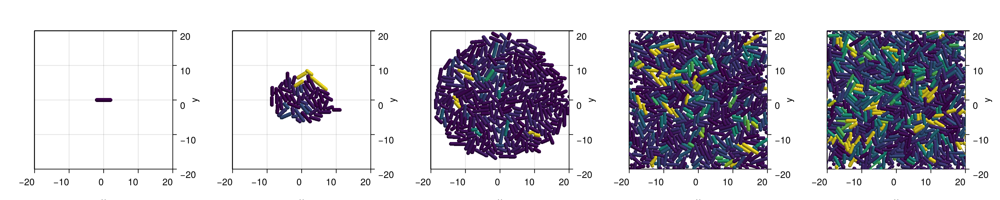

CairoMakie.Screen{IMAGE}


In [189]:
fig = Figure(size=(1500,300))
com_load, times = load_parameters_log(file)
# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
for (i,j) in enumerate([1:round(Int,length(com_load)/4):length(com_load);length(com_load)])
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents3D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:p],
    colorrange = (0, 100),
    colormap = :viridis
)

    xlims!(-20,20)
    ylims!(-20,20)
    zlims!(-10,10)
end

display(fig)

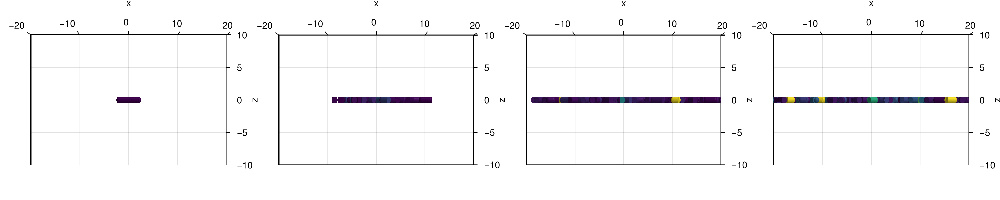

CairoMakie.Screen{IMAGE}


In [190]:
fig = Figure(size=(1500,300))

# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
for (i,j) in enumerate([1:round(Int,length(com_load)/4):length(com_load);length(com_load)][1:4])
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=0,
                ylabelvisible=false,
                yticklabelsvisible=false,
                ygridvisible=false,
                yspinesvisible=false
            )

    plotAgents3D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:p],
    colorrange = (0, 100),
    colormap = :viridis
)

    xlims!(-20,20)
    ylims!(-20,20)
    zlims!(-10,10)
end

display(fig)

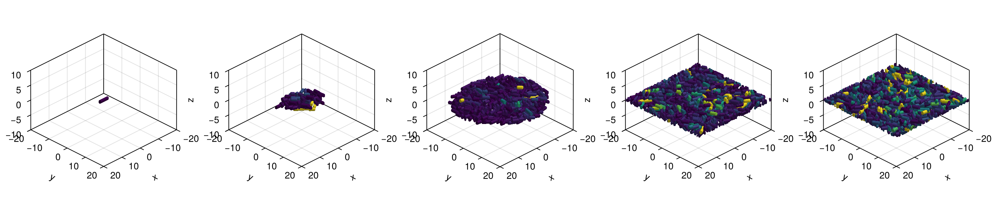

CairoMakie.Screen{IMAGE}


In [191]:
fig = Figure(size=(1500,300))
com_load, times = load_parameters_log(file)
# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
for (i,j) in enumerate([1:round(Int,length(com_load)/4):length(com_load);length(com_load)])
    ax = Axis3(fig[1,i],
                azimuth = π/4,    # 45° en XY
                elevation = π/6,  # 30° arriba del plano
            )

    plotAgents3D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:p],
    colorrange = (0, 100),
    colormap = :viridis
)

    xlims!(-20,20)
    ylims!(-20,20)
    zlims!(-10,10)
end

display(fig)

In [192]:

# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax = Axis3(grid[1, 1]; azimuth=3*π/2,
                elevation=π/2,)
hidedecorations!(ax)     # oculta ticks, etiquetas y más
ax.xgridvisible = true
ax.ygridvisible = true

Makie.record(fig, "Colony_3D.mp4", 1:Int(length(com_load)); framerate = 10) do j
 
    Makie.empty!(ax)

    plotAgents3D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:p],
    colorrange = (0, 100),
    colormap = :viridis
)

    xlims!(ax, - (50), 50)
    ylims!(ax, - (50),  50)
end


"Colony_3D.mp4"

# Terracing

In [124]:
rod3D_grow = ABM(3,
    agent = Dict(
            :theta=>Float64,
            :phi =>Float64,
            :d=>Float64,
            :l=>Float64,
            :fx=>Float64,
            :fy=>Float64,
            :fz=>Float64,
            :Wtheta=>Float64,
            :Wphi=>Float64,
            :lTarget => Float64,
            :growth=>Float64,
            :p=>Float64,
            :xpili1=>Float64,
            :ypili1=>Float64,
            :t_pili1=>Int,
            :xpili2=>Float64,
            :ypili2=>Float64,
            :t_pili2=>Int,
        ),    #Local Interaction Parameters

    model = Dict(
            :E =>Float64,
            :eta =>Float64,
            :eps =>Float64,
            :gamma =>Float64,
            :lMax => Float64,
            :σlTarget => Float64,
            :Ebv => Float64,
            :kb => Float64,
            :Δ0 => Float64,
            :Δmax => Float64,
            :T_eng => Float64,
            :hmax => Float64,

        ),        #Global parameters

    agentODE = quote

        fx = 0
        fy = 0
        fz = 0
        Wtheta = 0
        Wphi = 0 
        
        dt(l) = l*growth*1/(1+p)

        @loopOverNeighbors i2 begin

            #Use the model provided in the documentation
            Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.repulsiveForces_rods3d(x,y,z,d,l,theta, phi,
                                    x[i2],y[i2],z[i2],d[i2],l[i2],theta[i2], phi[i2], eta, E)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            fz += Fijz
            Wtheta += Wijtheta
            Wphi += Wijphi

            #Use the model provided in the documentation
            Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.attractiveForces_rods_yukawa3d(x,y,z,d,l,theta, phi,
                                    x[i2],y[i2],z[i2],d[i2],l[i2],theta[i2], phi[i2], eta, eps, gamma)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            fz += Fijz
            Wtheta += Wijtheta
            Wphi += Wijphi       
            
        end

        Fijx, Fijy, Fijz, Wijtheta, Wijphi,xpili1, ypili1, t_pili1, xpili2, ypili2, t_pili2 = CBMModels.wallForces_rods_bond3d(x,y,z,d,l,theta,phi, 
            eta, Ebv, kb, Δ0, Δmax, T_eng, hmax, xpili1, ypili1, t_pili1, xpili2, ypili2, t_pili2)

        #Append the repulsive forces
        fx += Fijx
        fy += Fijy
        fz += Fijz
        Wtheta += Wijtheta
        Wphi += Wijphi      

        p = sqrt(fx^2 + fy^2 + fz^2)
        #Equations
        dt(x) =  fx 
        dt(y) =  fy 
        dt(z) =  fz
        dt(theta) =  Wtheta
        dt(phi) = Wphi
    end,

    agentRule = quote #Bound cells

        #Add division
        if l > lTarget
            ww = CBMDistributions.uniform(-1,1)

            # Dirección 3D de la varilla (unitaria)
            ux = cos(theta)*cos(phi)
            uy = sin(theta)*cos(phi)
            uz = sin(phi)

            # === Hija A (delantera, +u) ===
            @addAgent(
                x = x + (l+d)/4 * ux,
                y = y + (l+d)/4 * uy,
                z = z + (l+d)/4 * uz,
                l = (l-d)/2,
                Wtheta = ww,
                lTarget = CBMDistributions.uniform(lMax-σlTarget, lMax+σlTarget),
                xpili1 = xpili1,  ypili1 = ypili1,  t_pili1 = t_pili1,   # hereda polo 1
                xpili2 = NaN,     ypili2 = NaN,     t_pili2 = 0          # polo nuevo
            )

            # === Hija B (trasera, −u) ===
            @addAgent(
                x = x - (l+d)/4 * ux,
                y = y - (l+d)/4 * uy,
                z = z + (l+d)/4 * uz,
                l = (l-d)/2,
                Wtheta = ww,
                lTarget = CBMDistributions.uniform(lMax-σlTarget, lMax+σlTarget),
                xpili1 = NaN,     ypili1 = NaN,     t_pili1 = 0,         # polo nuevo
                xpili2 = xpili2,  ypili2 = ypili2,  t_pili2 = t_pili2    # hereda polo 2
            )

            # Elimina célula madre
            @removeAgent()
        end

        
    end,

    # neighborsAlg=CBMNeighbors.VerletDisplacement(skin=4.0, nMaxNeighbors=500),
    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=4),
    platform=CPU(),
    agentAlg = CBMIntegrators.Heun()
);


In [148]:
com = Community(rod3D_grow,
            N=1,
            dt=0.0001,
            simBox = [-100 100;-100 100.; -100 100],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.E=5* 1.E5 *m/(t^2*d) #Pa
com.eta = 200 *m/(t^2*d) #Pa h
# com.eps = 1.E4 *m/(t^2*d) #Pa um^4
com.eps = 0 #Pa um^4
com.gamma=1

com.Ebv = 1.E6 *m/(t^2*d) #Pa um
com.kb = 1.E4 *m/(t^2*d) #Pa /um
com.Δ0 = 0.5 #um
com.Δmax = 4 #um
com.T_eng = 10 
com.hmax = 10 

com.xpili1 = 0.0
com.ypili1 = 0.0
com.t_pili1 = 0.0
com.xpili2 = 0.0
com.ypili2 = 0.0
com.t_pili2 = 0.0


com.growth = 5
com.lMax = 4.     
com.σlTarget = 1.5 

com.d = 1.        
com.l = 3.99      
com.lTarget = 4.  
com.x=0
com.y=0
com.z=com.d/2
com.theta=0
com.phi=0

com.p=0

# com.PGA=0
# com.alpha_PGA = 10000
# com.delta_PGA = 100
# com.D_PGA = 50
# com.npc = 1
# com.v = 2.5*10^7
# com.Kpc=0.00001
# com.Kpq=10
# com.npq=10

# com.PGA=0
# com.alpha_PGA = 1000
# com.alpha_PGA = 0
# com.delta_PGA = 2000
# com.beta_PGA = 0
# com.Kp = 0.2
# com.D_PGA = 20
# com.npc = 1
# com.nu = 2.5*10^8
# com.Kpc=0.01
# com.Kpq=10
# com.npq=20

# com.D_c = 1000
# com.cm = 1 #Medium concentration
# com.c = com.cm 
# com.Kc = 1 #Half saturation constant for the medium
# com.beta_c = 50 #Growth rate of the cells in the medium


# com.Vm = -149
# com.alpha_V = -150
# com.delta_V = 1
# com.beta_V = 100
# com.KVc = 5E-4
# com.nV = 10

# com.QS=0
# com.alpha_QS = 10
# com.delta_QS = 0.5
# com.D_QS = 50 

# com.A=0.3




0

In [149]:

file="atract.txt"
open(file, "w") do f
    # clear file at start
end

In [150]:
prev_steps=Int(round(0/com.dt))
steps=Int(round(5/com.dt))
saveEach = Int(round(1/com.dt))/100
N=com.N*4

loadToPlatform!(com,preallocateAgents=N)

step=prev_steps
log_community_state(com.parameters, step, file)


while (step<steps+1) & (com.N < 2000)
    
    step!(com)

    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N[1] <= 0
                println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N[1]  < 4*com.N[1]
                N = 15*com.N[1]
        end 
        println("Step ",step, " N: ", com.N[1])
        log_community_state(com.parameters, step, file)
        loadToPlatform!(com,preallocateAgents=N)
    end
    step += 1
end
bringFromPlatform!(com)

Step 0 N: 1
Step 100 N: 2
Step 200 N: 2
Step 300 N: 2
Step 400 N: 2
Step 500 N: 2
Step 600 N: 2
Step 700 N: 2
Step 800 N: 2
Step 900 N: 2
Step 1000 N: 2
Step 1100 N: 2
Step 1200 N: 2
Step 1300 N: 2
Step 1400 N: 2
Step 1500 N: 2
Step 1600 N: 2
Step 1700 N: 2
Step 1800 N: 2
Step 1900 N: 2
Step 2000 N: 2
Step 2100 N: 2
Step 2200 N: 2
Step 2300 N: 2
Step 2400 N: 2
Step 2500 N: 2
Step 2600 N: 2
Step 2700 N: 2
Step 2800 N: 2
Step 2900 N: 2
Step 3000 N: 2
Step 3100 N: 2
Step 3200 N: 2
Step 3300 N: 2
Step 3400 N: 2
Step 3500 N: 2
Step 3600 N: 2
Step 3700 N: 2
Step 3800 N: 2
Step 3900 N: 2
Step 4000 N: 2
Step 4100 N: 2
Step 4200 N: 2
Step 4300 N: 2
Step 4400 N: 2
Step 4500 N: 2
Step 4600 N: 2
Step 4700 N: 2
Step 4800 N: 2
Step 4900 N: 3
Step 5000 N: 3
Step 5100 N: 3
Step 5200 N: 4
Step 5300 N: 4
Step 5400 N: 4
Step 5500 N: 4
Step 5600 N: 4
Step 5700 N: 4
Step 5800 N: 4
Step 5900 N: 4
Step 6000 N: 4
Step 6100 N: 4
Step 6200 N: 4
Step 6300 N: 4
Step 6400 N: 4
Step 6500 N: 4
Step 6600 N: 4
Step 67

In [151]:
com.x

41-element Vector{Float64}:
 -2.9356230056044867
  0.6897723805372161
 -2.4000953341437055
  3.38808963696354
  4.915675473821543
 -2.717679737407242
 -1.2321189117770204
  1.2919391191228675
  3.3527372233115287
  1.1388326324403182
  ⋮
  0.3132940308735145
 -2.1524105431382465
 -3.8819803182412564
  0.4942153639489029
 -2.724122799196739
 -5.485004388954418
 -3.750899851710869
  4.664172111688955
  6.824529207617867

In [152]:
com.y

41-element Vector{Float64}:
  0.40854974440665676
  1.5256874987271336
  1.2681835269695332
  1.2785045216484217
 -0.7727536682504326
 -1.723827041443992
 -0.5082219929314877
 -0.6853186624788271
 -2.9444975085956924
  4.996170167159994
  ⋮
  4.270483777153805
 -4.357266149933666
 -0.10102297278629167
 -3.870377039111141
 -1.9051509204083912
  2.459537231786764
  2.419491881538375
  0.4852482698236406
  0.8959596899246681

In [153]:
com.z

41-element Vector{Float64}:
 1.898036544579602
 0.4663551540254223
 0.43109530189680567
 0.4655220128070013
 1.3648271629807978
 2.5580151530528625
 0.4437599692352095
 0.8871831660491143
 0.45421335320949313
 0.482028586895058
 ⋮
 0.47966470940758793
 0.46847047910277717
 0.47004766114476443
 0.439959128623176
 0.4887390012985801
 0.4754662207584557
 0.898091551561505
 0.4529757233089016
 0.6782282160195416

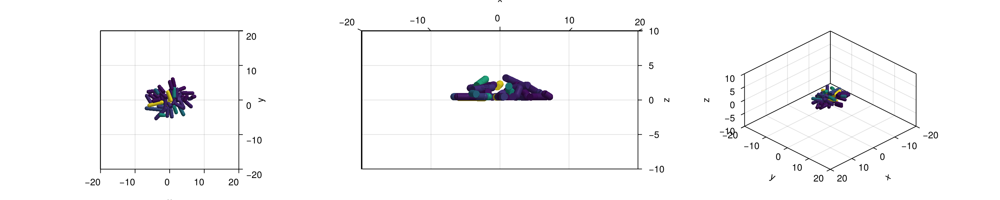

CairoMakie.Screen{IMAGE}


In [154]:
fig = Figure(size=(1500,300))

# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.

    ax = Axis3(fig[1,1],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.5)
            )

    plotAgents3D!(
    ax,
    com[:x],
    com[:y],
    com[:z],
    com[:d],
    com[:l],
    com[:theta],
    com[:phi],
    com[:p],
    colorrange = (0, 100),
    colormap = :viridis
    )

    xlims!(-20,20)
    ylims!(-20,20)
    zlims!(-10,10)

    ax2 = Axis3(fig[1,2],
                azimuth=3*π/2,
                elevation=0,
                ylabelvisible=false,
                yticklabelsvisible=false,
                ygridvisible=false,
                yspinesvisible=false,
                aspect = (1,1,0.5)
            )

    plotAgents3D!(
    ax2,
    com[:x],
    com[:y],
    com[:z],
    com[:d],
    com[:l],
    com[:theta],
    com[:phi],
    com[:p],
    colorrange = (0, 100),
    colormap = :viridis
)

    xlims!(-20,20)
    ylims!(-20,20)
    zlims!(-10,10)

    ax3 = Axis3(fig[1,3],
            azimuth = π/4,    # 45° en XY
            elevation = π/6,  # 30° arriba del plano
            aspect = (1,1,0.5)
        )

    plotAgents3D!(
    ax3,
    com[:x],
    com[:y],
    com[:z],
    com[:d],
    com[:l],
    com[:theta],
    com[:phi],
    com[:p],
    colorrange = (0, 100),
    colormap = :viridis
)

    xlims!(-20,20)
    ylims!(-20,20)
    zlims!(-10,10)


display(fig)

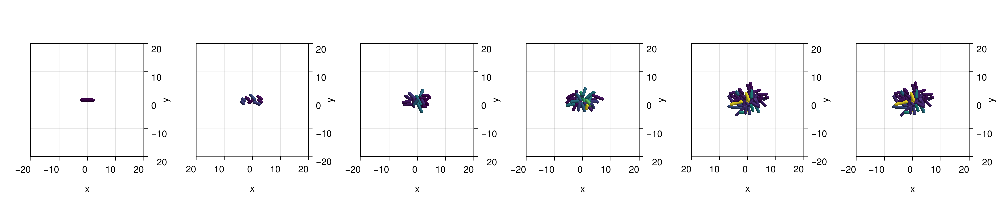

CairoMakie.Screen{IMAGE}


In [155]:
fig = Figure(size=(1500,300))
com_load, times = load_parameters_log(file)
# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
for (i,j) in enumerate([1:round(Int,length(com_load)/4):length(com_load);length(com_load)])
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false,
                aspect = (1,1,0.5)
            )

    plotAgents3D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:p],
    colorrange = (0, 100),
    colormap = :viridis
)

    xlims!(-20,20)
    ylims!(-20,20)
    zlims!(-10,10)
end

display(fig)

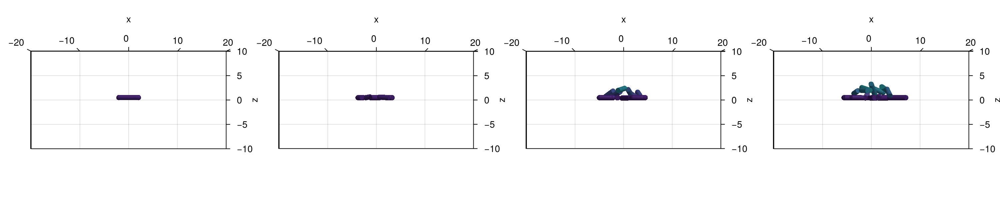

CairoMakie.Screen{IMAGE}


In [156]:
fig = Figure(size=(1500,300))

# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
for (i,j) in enumerate([1:round(Int,length(com_load)/4):length(com_load);length(com_load)][1:4])
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=0,
                ylabelvisible=false,
                yticklabelsvisible=false,
                ygridvisible=false,
                yspinesvisible=false,
                aspect = (1,1,0.5)
            )

    plotAgents3D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:z],
    colorrange = (0, 5),
    colormap = :viridis
)

    xlims!(-20,20)
    ylims!(-20,20)
    zlims!(-10,10)
end

display(fig)

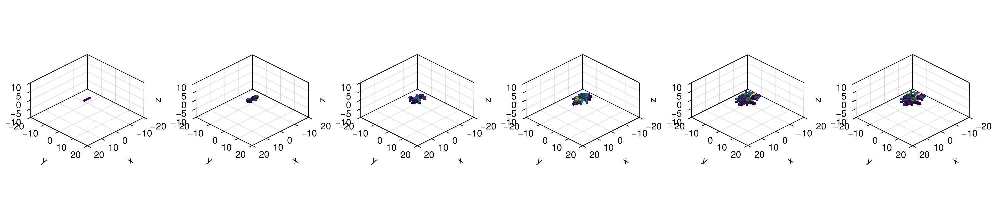

CairoMakie.Screen{IMAGE}


In [157]:
fig = Figure(size=(1500,300))
com_load, times = load_parameters_log(file)
# azimuth: ángulo en el plano XY, contado desde el eje X positivo.
# elevation: inclinación sobre el plano XY; 0 = vista plana desde arriba, π/2 = vista lateral pura en el plano horizontal.
for (i,j) in enumerate([1:round(Int,length(com_load)/4):length(com_load);length(com_load)])
    ax = Axis3(fig[1,i],
                azimuth = π/4,    # 45° en XY
                elevation = π/6,  # 30° arriba del plano
                aspect = (1,1,0.5)
            )

    plotAgents3D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:p],
    colorrange = (0, 100),
    colormap = :viridis
)

    xlims!(-20,20)
    ylims!(-20,20)
    zlims!(-10,10)
end

display(fig)

In [160]:

# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax1 = Axis3(grid[1, 1]; azimuth=3*π/2,
                elevation=π/2,
                aspect = (1,1,1))
ax2 = Axis3(grid[2, 1]; azimuth=3*π/2,
                elevation=0,
                aspect = (1,1,0.5))
hidedecorations!(ax1)     # oculta ticks, etiquetas y más
hidedecorations!(ax2)     # oculta ticks, etiquetas y más
ax1.xgridvisible = true
ax1.ygridvisible = true

Makie.record(fig, "Colony_3D_atract.mp4", 1:1:Int(length(com_load)); framerate = 5) do j
 
    Makie.empty!(ax1)
    Makie.empty!(ax2)

    plotAgents3D!(
    ax1,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:z],
    colorrange = (0, 2),
    colormap = :viridis
)

    plotAgents3D!(
    ax2,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:z],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:phi],
    com_load[j][:z],
    colorrange = (0, 2),
    colormap = :viridis
)

    xlims!(ax1,-10,10)
    ylims!(ax1,-10,10)
    zlims!(ax1,-2,8)

    xlims!(ax2,-10,10)
    ylims!(ax2,-10,10)
    zlims!(ax2,-2,8)
end


"Colony_3D_atract.mp4"

In [49]:
j=6
com_load[j][:xpili1], com_load[j][:xpili2]



(Any[-0.49979383769389585, 3.4889066499452657], Any[-3.4889066499452657, 0.49979383769389585])

In [50]:
com_load[j][:t_pili1],com_load[j][:t_pili2]

(Any[-1, -1], Any[-1, -1])

In [51]:
j=7
com_load[j][:xpili1], com_load[j][:xpili2]

(Any[-0.49979383769389585, 1.7610372825200695, 3.4889066499452657], Any[-3.4889066499452657, 0.49979383769389585, 2.7986429975378])

In [52]:
com_load[j][:t_pili1],com_load[j][:t_pili2]

(Any[-1, -1, -1], Any[-1, -1, -1])